## Importing Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

## Load the data

In [2]:
credit = pd.read_csv(r'cluster.csv')

In [3]:
credit.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [4]:
# Intital descriptive analysis of data.
credit.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CUST_ID,8950,8950,C10001,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BALANCE,8950.0,NaN,NaN,NaN,1564.474828,2081.531879,0.0,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,NaN,NaN,NaN,0.877271,0.236904,0.0,0.888889,1.0,1.0,1.0
PURCHASES,8950.0,NaN,NaN,NaN,1003.204834,2136.634782,0.0,39.635,361.28,1110.13,49039.57
ONEOFF_PURCHASES,8950.0,NaN,NaN,NaN,592.437371,1659.887917,0.0,0.0,38.0,577.405,40761.25
INSTALLMENTS_PURCHASES,8950.0,NaN,NaN,NaN,411.067645,904.338115,0.0,0.0,89.0,468.6375,22500.0
CASH_ADVANCE,8950.0,NaN,NaN,NaN,978.871112,2097.163877,0.0,0.0,0.0,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,NaN,NaN,NaN,0.490351,0.401371,0.0,0.083333,0.5,0.916667,1.0
ONEOFF_PURCHASES_FREQUENCY,8950.0,NaN,NaN,NaN,0.202458,0.298336,0.0,0.0,0.083333,0.3,1.0
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,NaN,NaN,NaN,0.364437,0.397448,0.0,0.0,0.166667,0.75,1.0


In [5]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

##### Missing Value Treatment

In [6]:
credit.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [7]:
credit = credit.dropna()

In [8]:
credit.isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

### 1.Deriving New KPI

#### 1A. Monthly_avg_purchase and Cash Advance Amount

In [9]:
credit['Monthly_avg_purchase']=credit['PURCHASES']/credit['TENURE']
credit['Monthly_cash_advance']=credit['CASH_ADVANCE']/credit['TENURE']

In [10]:
credit['Monthly_avg_purchase'].head()

0      7.950000
1      0.000000
2     64.430833
4      1.333333
5    111.106667
Name: Monthly_avg_purchase, dtype: float64

In [11]:
credit['Monthly_cash_advance'].head()

0      0.000000
1    536.912124
2      0.000000
4      0.000000
5      0.000000
Name: Monthly_cash_advance, dtype: float64

#### 1B. Purchase_type 
- To find what type of purchases customers are making on credit card,lets explore the data.

In [12]:
credit[credit['ONEOFF_PURCHASES']==0]['ONEOFF_PURCHASES'].count()

4113

In [13]:
credit.loc[:,['ONEOFF_PURCHASES','INSTALLMENTS_PURCHASES']].head(20)

,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES
0,0.00,95.40
1,0.00,0.00
2,773.17,0.00
4,16.00,0.00
5,0.00,1333.28
6,6402.63,688.38
7,0.00,436.20
8,661.49,200.00
9,1281.60,0.00
10,0.00,920.12


In [14]:
credit[(credit['ONEOFF_PURCHASES']==0) & (credit['INSTALLMENTS_PURCHASES']==0)].shape

(1965, 20)

In [15]:
credit[(credit['ONEOFF_PURCHASES']>0) & (credit['INSTALLMENTS_PURCHASES']>0)].shape

(2741, 20)

In [16]:
credit[(credit['ONEOFF_PURCHASES']>0) & (credit['INSTALLMENTS_PURCHASES']==0)].shape

(1782, 20)

In [17]:
credit[(credit['ONEOFF_PURCHASES']==0) & (credit['INSTALLMENTS_PURCHASES']>0)].shape

(2148, 20)

**I found out that there are 4 types of purchase behaviour in the data set.**
               
               1.People who only do One-Off Purchases.
               2.People who only do Installments Purchases.
               3.People who do both.
               4.People who do none.
               
**So deriving a categorical variable based on the behaviour.**

In [18]:
def purchase(credit):
    if (credit['ONEOFF_PURCHASES']==0) & (credit['INSTALLMENTS_PURCHASES']==0):
        return 'none'
    if (credit['ONEOFF_PURCHASES']>0) & (credit['INSTALLMENTS_PURCHASES']>0):
        return 'both_oneoff_installment'
    if (credit['ONEOFF_PURCHASES']>0) & (credit['INSTALLMENTS_PURCHASES']==0):
        return 'one_off'
    if (credit['ONEOFF_PURCHASES']==0) & (credit['INSTALLMENTS_PURCHASES']>0):
        return 'istallment'

In [19]:
credit['purchase_type']=credit.apply(purchase,axis=1)

In [20]:
credit['purchase_type'].value_counts()

purchase_type
both_oneoff_installment    2741
istallment                 2148
none                       1965
one_off                    1782
Name: count, dtype: int64

#### 1C.Limit_Usage (balance to credit limit ratio)
- Lower value implies cutomers are maintaing thier balance properly. Lower value means good credit score

In [21]:
credit['limit_usage']=credit.apply(lambda x: x['BALANCE']/x['CREDIT_LIMIT'], axis=1)

In [22]:
credit['limit_usage'].head()

0    0.040901
1    0.457495
2    0.332687
4    0.681429
5    1.005460
Name: limit_usage, dtype: float64

#### 1D.Payment to minimum payments Ratio


In [23]:
credit['payment_minpay']=credit.apply(lambda x:x['PAYMENTS']/x['MINIMUM_PAYMENTS'],axis=1)
credit['payment_minpay'].describe()

count    8636.000000
mean        9.351080
std       120.293843
min         0.000730
25%         0.957560
50%         2.170678
75%         6.262127
max      6840.528861
Name: payment_minpay, dtype: float64

In [24]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8636 entries, 0 to 8949
Data columns (total 23 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8636 non-null   object 
 1   BALANCE                           8636 non-null   float64
 2   BALANCE_FREQUENCY                 8636 non-null   float64
 3   PURCHASES                         8636 non-null   float64
 4   ONEOFF_PURCHASES                  8636 non-null   float64
 5   INSTALLMENTS_PURCHASES            8636 non-null   float64
 6   CASH_ADVANCE                      8636 non-null   float64
 7   PURCHASES_FREQUENCY               8636 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8636 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8636 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8636 non-null   float64
 11  CASH_ADVANCE_TRX                  8636 non-null   int64  
 12  PURCHASES_T

##### Extreme value Treatment
- Since there are variables having extreme values, I am doing log-transformation on the dataset to remove outlier effect 

In [25]:
# log tranformation
cr_log=credit.drop(['CUST_ID','purchase_type'],axis=1).applymap(lambda x: np.log(x+1))

In [26]:
cr_log.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Monthly_avg_purchase,Monthly_cash_advance,limit_usage,payment_minpay
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,...,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,6.265737,0.632000,4.928905,3.239500,3.387883,3.349135,0.365169,0.161321,0.273244,0.115484,...,1.916439,8.099572,6.814890,5.922564,0.122011,2.521363,3.076159,2.183353,0.302751,1.398452
std,1.895982,0.126199,2.922819,3.252619,3.091009,3.571114,0.277233,0.217894,0.282259,0.157941,...,1.378707,0.822341,1.159994,1.190068,0.214214,0.127535,2.007832,2.433957,0.249312,0.924909
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,3.931826,0.048326,0.018982,0.000000,1.945910,0.000000,0.000000,0.000000,0.000730
25%,5.004584,0.646627,3.792507,0.000000,0.000000,0.000000,0.080042,0.000000,0.000000,0.000000,...,0.693147,7.378384,6.039205,5.136760,0.000000,2.564949,1.558145,0.000000,0.046319,0.671699
50%,6.822040,0.693147,5.930666,3.828533,4.562106,0.000000,0.405465,0.080042,0.154151,0.000000,...,2.079442,8.006701,6.799809,5.747647,0.000000,2.564949,3.532591,0.000000,0.276312,1.153945
75%,7.652639,0.693147,7.044888,6.397096,6.184453,7.032964,0.650588,0.287682,0.559616,0.223144,...,2.944439,8.779711,7.576683,6.717196,0.154151,2.564949,4.613894,4.625128,0.545662,1.982673
max,9.854515,0.693147,10.800403,10.615512,10.021315,10.760839,0.693147,0.693147,0.693147,0.916291,...,5.883322,10.308986,10.834125,11.243832,0.693147,2.564949,8.315721,8.276166,2.827902,8.830767


In [27]:
col=['BALANCE','PURCHASES','CASH_ADVANCE','TENURE','PAYMENTS','MINIMUM_PAYMENTS','PRC_FULL_PAYMENT','CREDIT_LIMIT']
cr_pre=cr_log[[x for x in cr_log.columns if x not in col ]]

### 2.Insights from new KPI's

<Axes: ylabel='purchase_type'>

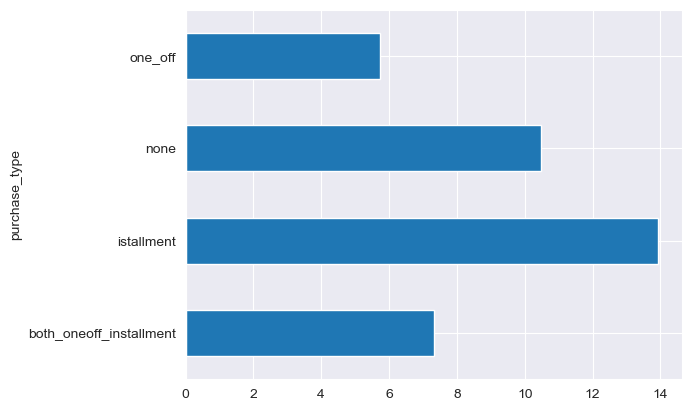

In [28]:
# Average payment_minpayment ratio for each purchse type.
credit.groupby('purchase_type').apply(lambda x: np.mean(x['payment_minpay'])).plot.barh()

##### Insight 1: Customers With Installment Purchases are Paying Dues

Text(0.5, 1.0, 'Average cash advance taken by customers of different Purchase type : Both, None,Installment,One_Off')

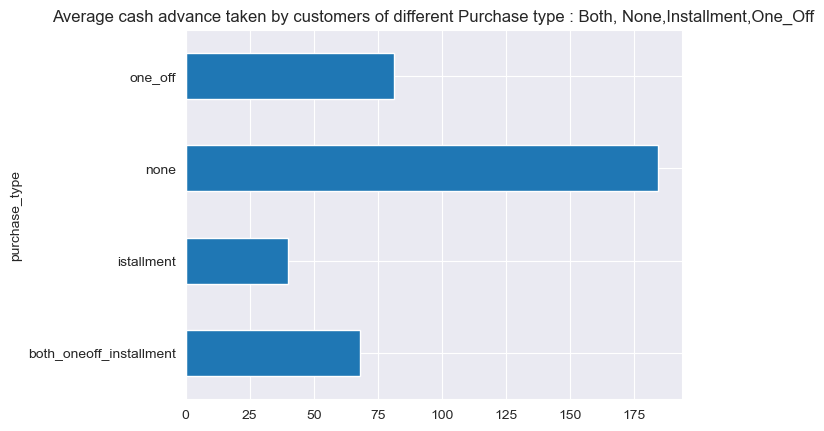

In [29]:
credit.groupby('purchase_type').apply(lambda x: np.mean(x['Monthly_cash_advance'])).plot.barh()

plt.title('Average cash advance taken by customers of different Purchase type : Both, None,Installment,One_Off')

##### Insight 2: Customers who don't do either one-off or installment purchases take more cash on advance.

<Axes: ylabel='purchase_type'>

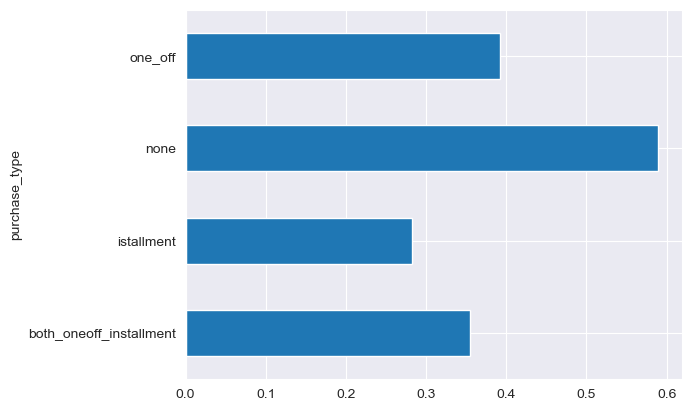

In [30]:
credit.groupby('purchase_type').apply(lambda x: np.mean(x['limit_usage'])).plot.barh()

### 3.Preparing for Machine learning

In [31]:
# creating Dummies for categorical variable
cr_pre['purchase_type']=credit.loc[:,'purchase_type']
pd.get_dummies(cr_pre['purchase_type']).head()

C:\Users\Ilqar\AppData\Local\Temp\ipykernel_364\1279089111.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cr_pre['purchase_type']=credit.loc[:,'purchase_type']


,both_oneoff_installment,istallment,none,one_off
0,False,True,False,False
1,False,False,True,False
2,False,False,False,True
4,False,False,False,True
5,False,True,False,False


In [32]:
cr_dummy=pd.concat([cr_pre,pd.get_dummies(cr_pre['purchase_type'])],axis=1)

In [33]:
l=['purchase_type']

In [34]:
cr_dummy=cr_dummy.drop(l,axis=1)
cr_dummy.isnull().sum()

BALANCE_FREQUENCY                   0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
Monthly_avg_purchase                0
Monthly_cash_advance                0
limit_usage                         0
payment_minpay                      0
both_oneoff_installment             0
istallment                          0
none                                0
one_off                             0
dtype: int64

In [35]:
cr_dummy.describe()

,BALANCE_FREQUENCY,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,Monthly_avg_purchase,Monthly_cash_advance,limit_usage,payment_minpay
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,0.632000,3.239500,3.387883,0.365169,0.161321,0.273244,0.115484,0.829327,1.916439,3.076159,2.183353,0.302751,1.398452
std,0.126199,3.252619,3.091009,0.277233,0.217894,0.282259,0.157941,1.015146,1.378707,2.007832,2.433957,0.249312,0.924909
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000730
25%,0.646627,0.000000,0.000000,0.080042,0.000000,0.000000,0.000000,0.000000,0.693147,1.558145,0.000000,0.046319,0.671699
50%,0.693147,3.828533,4.562106,0.405465,0.080042,0.154151,0.000000,0.000000,2.079442,3.532591,0.000000,0.276312,1.153945
75%,0.693147,6.397096,6.184453,0.650588,0.287682,0.559616,0.223144,1.609438,2.944439,4.613894,4.625128,0.545662,1.982673
max,0.693147,10.615512,10.021315,0.693147,0.693147,0.693147,0.916291,4.820282,5.883322,8.315721,8.276166,2.827902,8.830767


<Axes: >

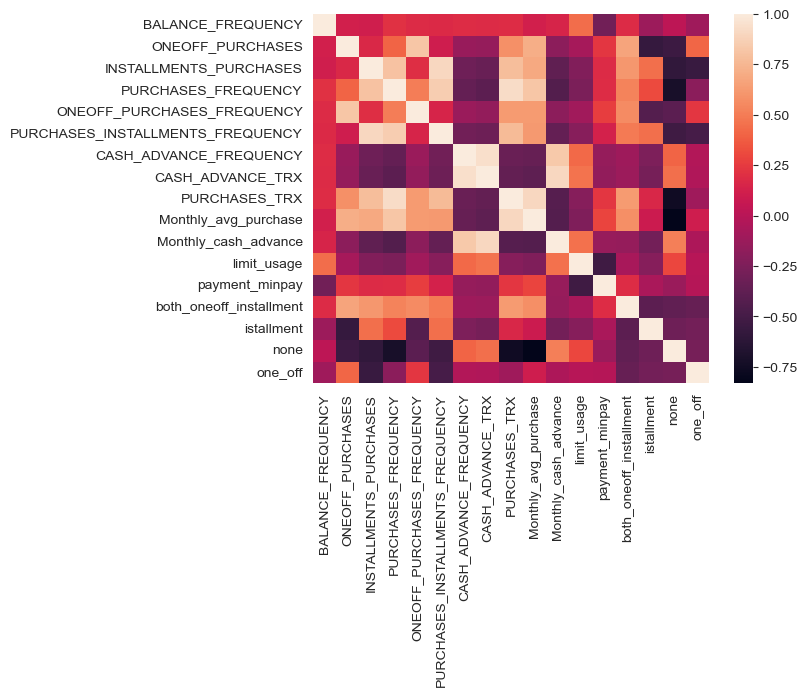

In [36]:
sns.heatmap(cr_dummy.corr())

<big>
- Heat map shows that many features are co-related so applying dimensionality reduction will help negating multi-colinearity in data
</big>


- Before applying PCA we will standardize data  to avoid effect of scale on our result. Centering and Scaling will make all features with equal weight.

##### Standardrizing data 
- To put data on the same scale 

In [37]:
from sklearn.preprocessing import  StandardScaler
sc=StandardScaler()
cr_scaled=sc.fit_transform(cr_dummy)

##### Applying PCA 

In [38]:
from sklearn.decomposition import PCA

In [39]:
var_ratio={}
for n in range(4,15):
    pc=PCA(n_components=n)
    cr_pca=pc.fit(cr_scaled)
    var_ratio[n]=sum(cr_pca.explained_variance_ratio_)

In [40]:
pc=PCA(n_components=5)

In [41]:
p=pc.fit(cr_scaled)

In [42]:
cr_scaled.shape

(8636, 17)

In [43]:
p.explained_variance_

array([6.88113414, 3.02043186, 2.51512961, 1.46015897, 1.13915767])

In [44]:
var_ratio

{4: 0.8161910419107422,
 5: 0.8831925574052781,
 6: 0.9200335112165572,
 7: 0.9422233494395842,
 8: 0.9622231210679604,
 9: 0.9742235381835362,
 10: 0.9837281511363233,
 11: 0.9897467673021264,
 12: 0.9927712725092294,
 13: 0.9954324841785809,
 14: 0.9979695392991017}

<Axes: >

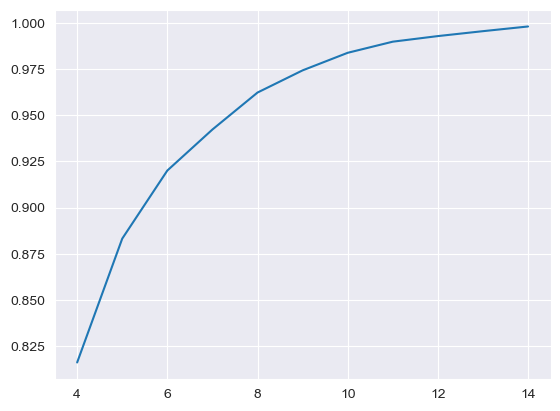

In [45]:
pd.Series(var_ratio).plot()

---
# Since 5 components are explaining about 87% variance so we select 5 components

---



In [46]:
pc_final=PCA(n_components=5).fit(cr_scaled)

reduced_cr=pc_final.fit_transform(cr_scaled)

In [47]:
dd=pd.DataFrame(reduced_cr)

In [48]:
dd.shape

(8636, 5)

In [49]:
col_list=cr_dummy.columns

In [50]:
col_list

Index(['BALANCE_FREQUENCY', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'Monthly_avg_purchase',
       'Monthly_cash_advance', 'limit_usage', 'payment_minpay',
       'both_oneoff_installment', 'istallment', 'none', 'one_off'],
      dtype='object')

In [51]:
# Factor Analysis : variance explained by each component- 
pd.DataFrame(pc_final.components_.T, columns=['PC_' +str(i) for i in range(5)],index=col_list)

,PC_0,PC_1,PC_2,PC_3,PC_4
BALANCE_FREQUENCY,0.023299,0.222703,-0.293887,-0.389167,-0.198175
ONEOFF_PURCHASES,0.215038,0.414040,0.226441,-0.008416,-0.024957
INSTALLMENTS_PURCHASES,0.310952,-0.102315,-0.310696,0.106140,-0.005524
PURCHASES_FREQUENCY,0.344823,0.014347,-0.165150,-0.055979,0.124917
ONEOFF_PURCHASES_FREQUENCY,0.214659,0.368207,0.155665,0.021668,-0.056712
PURCHASES_INSTALLMENTS_FREQUENCY,0.294255,-0.116651,-0.327939,0.042035,0.025864
CASH_ADVANCE_FREQUENCY,-0.216532,0.280230,-0.272039,0.153559,0.348779
CASH_ADVANCE_TRX,-0.231157,0.285545,-0.279078,0.159069,0.322053
PURCHASES_TRX,0.354049,0.106975,-0.105583,-0.037112,0.113216
Monthly_avg_purchase,0.345199,0.141993,0.017696,-0.056867,0.202798


In [52]:
# Factor Analysis : variance explained by each component- 
pd.Series(pc_final.explained_variance_ratio_,index=['PC_'+ str(i) for i in range(5)])

PC_0    0.404726
PC_1    0.177652
PC_2    0.147932
PC_3    0.085882
PC_4    0.067002
dtype: float64

## Key characteristics of the Silhouette score include:

### It ranges from -1 to +1:

Positive values indicate that data points belong to the correct clusters, indicating good clustering results.

A score of zero suggests overlapping clusters or data points equally close to multiple clusters.

Negative values indicate that data points are assigned to incorrect clusters, indicating poor clustering results.

In [53]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

wcss = []
silhouette_scores = []

for i in range(2, 7):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(reduced_cr)

    wcss_iter = kmeans.inertia_
    wcss.append(wcss_iter)

    y = kmeans.fit_predict(reduced_cr)
    silhouette_avg = silhouette_score(reduced_cr, y)
    silhouette_scores.append(silhouette_avg)

    wcss_str = '{:.40f}'.format(wcss_iter)
    print(f"Cluster {i}: WCSS = {wcss_str}, Silhouette Score = {silhouette_avg}")

I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 2: WCSS = 84379.9278378412855090573430061340332031250000, Silhouette Score = 0.3456936032467344


I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 3: WCSS = 62879.6531242247801856137812137603759765625000, Silhouette Score = 0.37191693487673516


I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 4: WCSS = 42762.3066865418441011570394039154052734375000, Silhouette Score = 0.45792735601172


I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 5: WCSS = 36181.4369845924229593947529792785644531250000, Silhouette Score = 0.4537711674625299


I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 6: WCSS = 31528.5616423558276437688618898391723632812500, Silhouette Score = 0.44856090790924413


Text(0, 0.5, 'Within-cluster Sum of Squares')

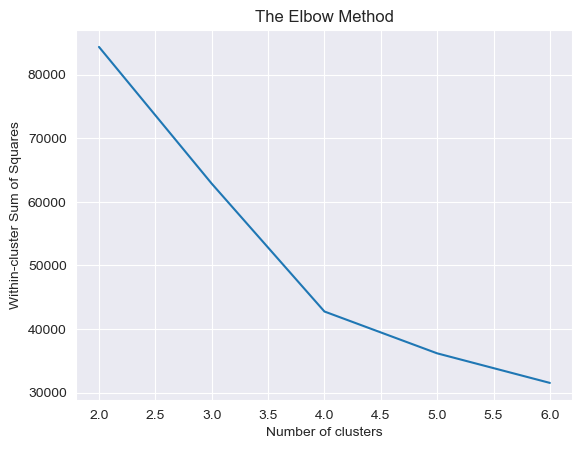

In [54]:
number_clusters = range(2,7)
plt.plot(number_clusters,wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Within-cluster Sum of Squares')

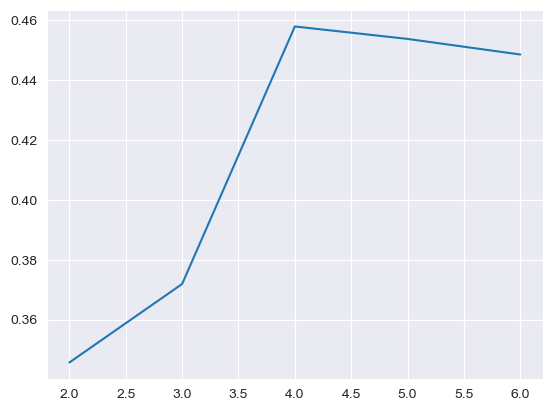

In [55]:
plt.plot(number_clusters,silhouette_scores)

In [56]:
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(reduced_cr)

I:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=4, random_state=42)

C:\Users\Ilqar\AppData\Local\Temp\ipykernel_364\250669998.py:4: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(reduced_cr[:,0],reduced_cr[:,1],c=label_color,cmap='Spectral',alpha=0.5)


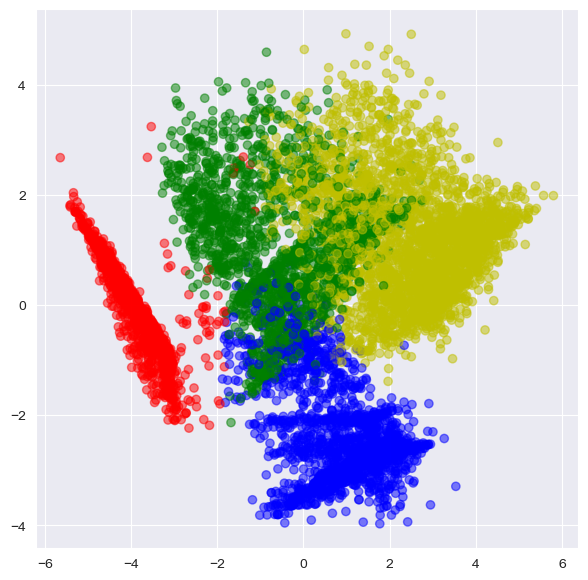

In [57]:
color_map={0:'r',1:'b',2:'g',3:'y'}
label_color=[color_map[l] for l in kmeans.labels_]
plt.figure(figsize=(7,7))
plt.scatter(reduced_cr[:,0],reduced_cr[:,1],c=label_color,cmap='Spectral',alpha=0.5)

In [58]:
credit['Cluster'] = kmeans.predict(reduced_cr)

In [59]:
PLOT = go.Figure()
for i in list(credit["Cluster"].unique()):


    PLOT.add_trace(go.Scatter3d(x = credit[credit["Cluster"]== i]['BALANCE'],
                                y = credit[credit["Cluster"] == i]['PURCHASES'],
                                z = credit[credit["Cluster"] == i]['CREDIT_LIMIT'],
                                mode = 'markers',marker_size = 6, marker_line_width = 1,
                                name = str(i)))
PLOT.update_traces(hovertemplate='BALANCE: %{x} <br>PURCHASES %{y} <br>DCREDIT_LIMIT: %{z}')


PLOT.update_layout(width = 800, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'BALANCE', titlefont_color = 'black'),
                                yaxis=dict(title = 'PURCHASES', titlefont_color = 'black'),
                                zaxis=dict(title = 'CREDIT_LIMIT', titlefont_color = 'black')),
                   font = dict(family = "Gilroy", color  = 'black', size = 12))

### Hierarchical Clustering

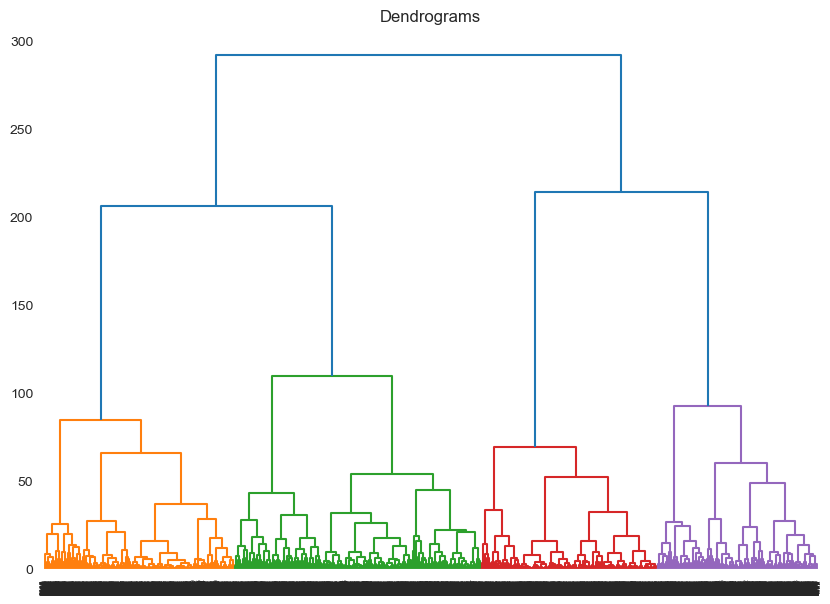

In [60]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))
plt.title("Dendrograms")
dend = shc.dendrogram(shc.linkage(reduced_cr, method='ward'))

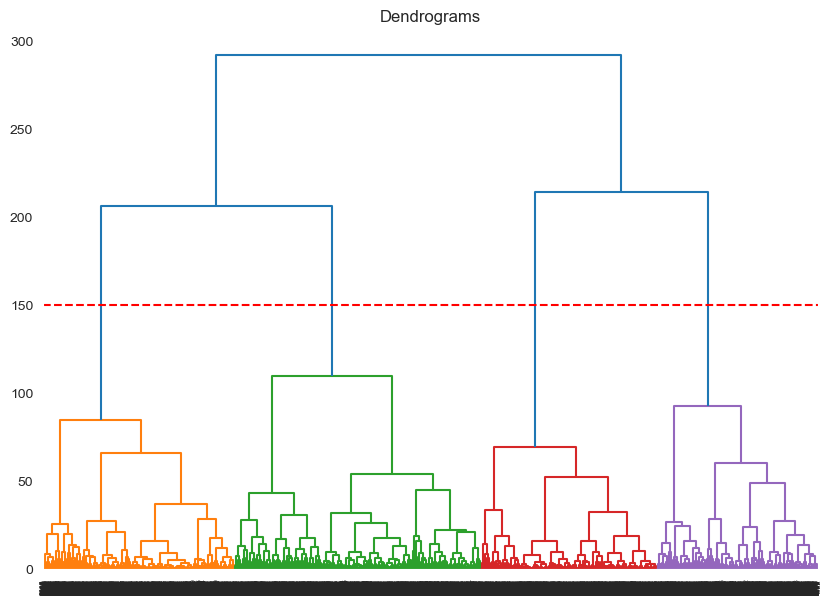

In [61]:
plt.figure(figsize=(10, 7))
plt.title("Dendrograms")
dend = shc.dendrogram(shc.linkage(reduced_cr, method='ward'))
plt.axhline(y=150, color='r', linestyle='--')

In [62]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
y = cluster.fit_predict(reduced_cr)
y

I:\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



array([3, 2, 1, ..., 3, 2, 1], dtype=int64)

In [63]:
credit['dependent_value'] = y

I:\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



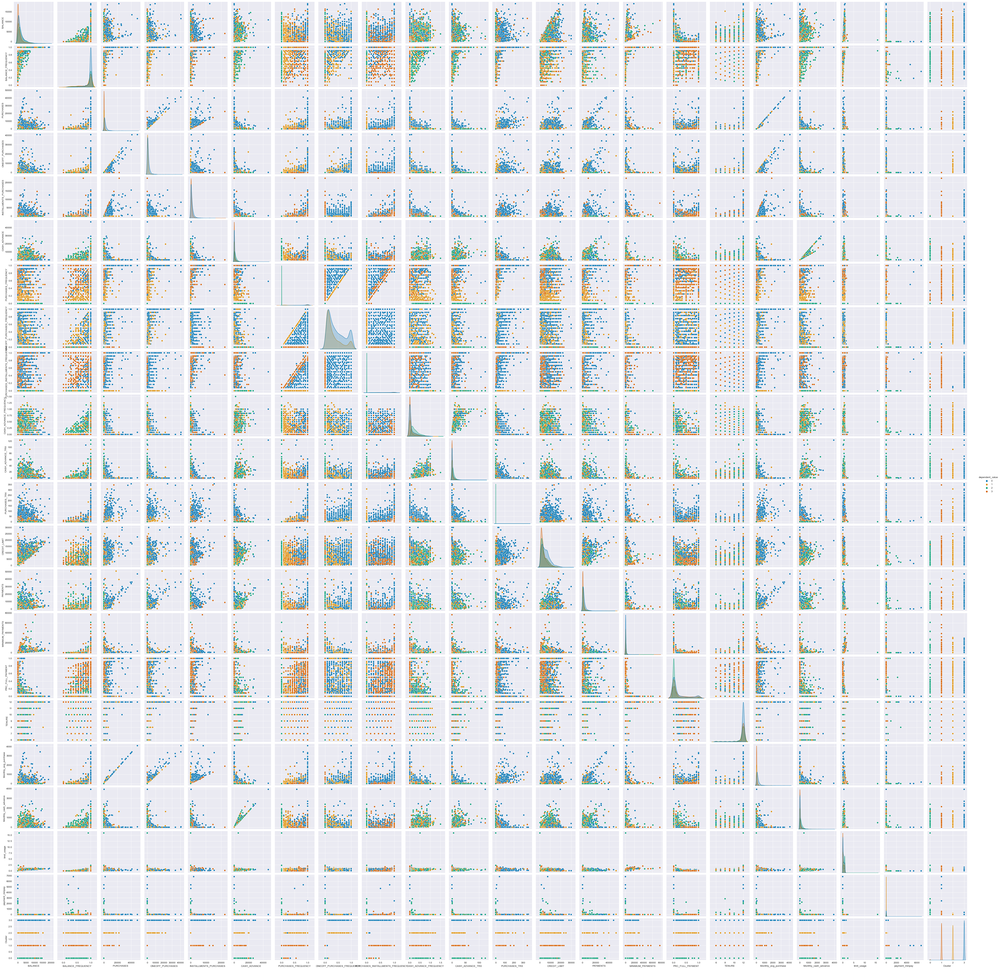

In [70]:
sns.pairplot(credit,hue='dependent_value',palette='colorblind')

In [65]:
silhouette_avg = silhouette_score(reduced_cr, y)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.457351677260858


In [66]:
X = reduced_cr.copy()
y = credit['dependent_value']

In [67]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [68]:
def evaluate(model, X_test, y_test):
    # Predict probabilities for each class
    y_prob = model.predict_proba(X_test)

    # Calculate Gini coefficient for all class values
    gini = 0
    num_classes = len(np.unique(y_test))
    for i in range(num_classes):
        true_labels = (y_test == i).astype(int)  # Convert to binary labels for the current class
        gini += roc_auc_score(true_labels, y_prob[:, i])

    # Normalize the Gini coefficient
    average_gini = (2 * gini / num_classes) - 1

    # Print model performance
    print('Model Performance')
    print('Average Gini coefficient:', average_gini)

    return average_gini

### Evaluating the model

In [69]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

base_model = RandomForestClassifier(n_estimators = 100, random_state = 42 )
base_model.fit(X_train, y_train)
base_accuracy = evaluate(base_model, X_test, y_test)

Model Performance
Average Gini coefficient: 0.9999995545855418
